### Phase 3 — Geospatial & Visual Exploratory Data Analysis

#### Objective
Explore spatial and environmental patterns influencing property prices by combining geospatial analysis with satellite imagery inspection. This notebook provides qualitative and quantitative insights into how location, neighborhood structure, and surrounding land use affect real estate valuation.

#### Key Analyses
- Plot geographic distribution of properties using latitude and longitude
- Visualize price variation across regions and identify high-value and low-value clusters
- Analyze spatial effects such as:
  - Proximity to water bodies
  - Urban density and road concentration
  - Green cover and open spaces
- Compare satellite images of high-priced vs low-priced properties to identify visual cues

#### Key Observations
- Properties near waterfronts and green areas exhibit higher market values
- Dense urban layouts and industrial textures correlate with lower prices
- Environmental context captured via satellite imagery provides complementary signals beyond tabular features

#### Output
- Geospatial visualizations highlighting regional price trends
- Qualitative comparisons of satellite imagery across price segments
- Foundational insights that inform model design and explainability analysis (Grad-CAM)



In [ ]:
import os
import random
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from shapely.geometry import Point
from PIL import Image

sns.set(style="whitegrid")

DATA_PATH = "../data/processed/train_clean.csv"
IMAGE_DIR = "../data/images/train"

RANDOM_SEED = 42
random.seed(RANDOM_SEED)

In [2]:
df = pd.read_csv(DATA_PATH)

print("Dataset shape:", df.shape)
df[['id', 'price', 'log_price', 'lat', 'long']].head()

Dataset shape: (16209, 16)


,id,price,log_price,lat,long
0,9117000170,268643,12.501142,47.4362,-122.187
1,6700390210,245000,12.409018,47.4034,-122.187
2,7212660540,200000,12.206078,47.2704,-122.313
3,8562780200,352499,12.772806,47.5321,-122.073
4,7760400350,232000,12.354497,47.3715,-122.074


### Image validation

In [4]:
image_files = set(os.listdir(IMAGE_DIR))
df["image_exists"] = df["id"].astype(str).apply(lambda x: f"{x}.0.png" in image_files)

coverage = df["image_exists"].mean() * 100
print(f"Image coverage: {coverage:.2f}%")

df["image_exists"].value_counts()

Image coverage: 99.99%


image_exists
True     16208
False        1
Name: count, dtype: int64

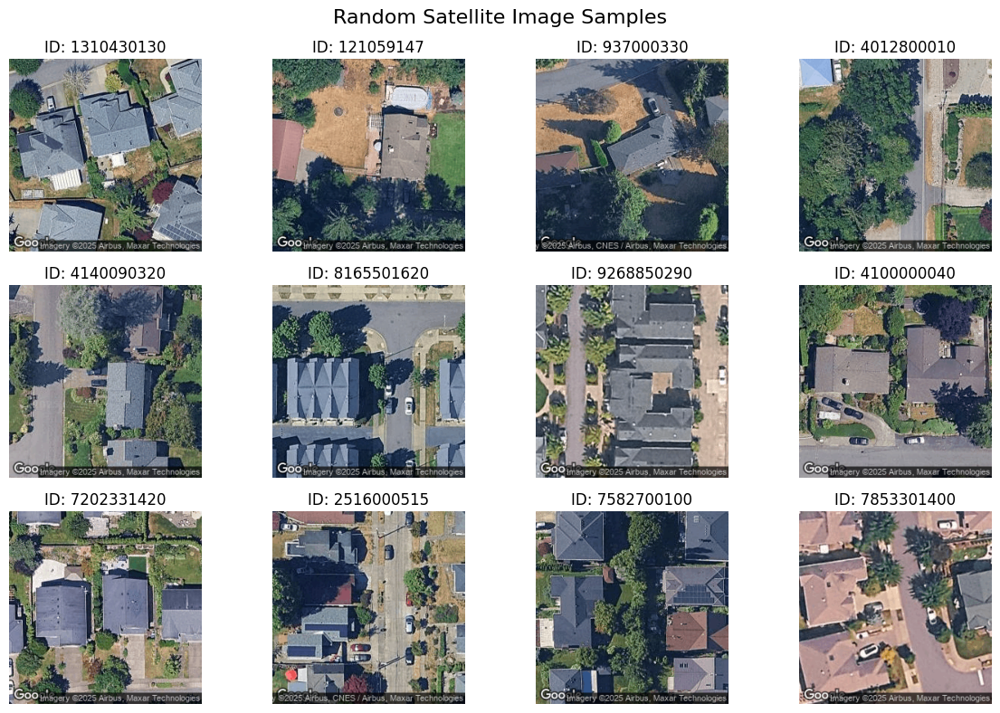

In [6]:
sample_ids = df[df["image_exists"]].sample(12, random_state=RANDOM_SEED)["id"]

plt.figure(figsize=(12, 8))

for i, property_id in enumerate(sample_ids, 1):
    img_path = os.path.join(IMAGE_DIR, f"{property_id}.0.png")
    img = Image.open(img_path)

    plt.subplot(3, 4, i)
    plt.imshow(img)
    plt.title(f"ID: {property_id}")
    plt.axis("off")

plt.suptitle("Random Satellite Image Samples", fontsize=16)
plt.tight_layout()
plt.show()

Waterfront properties: 113


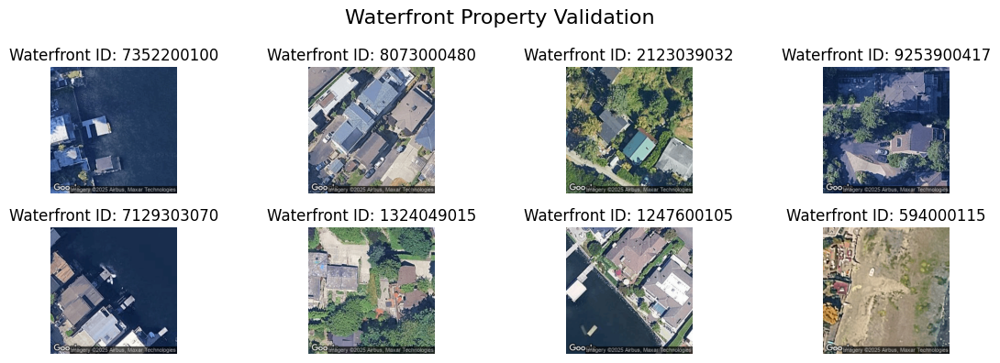

In [7]:
waterfront_df = df[(df["waterfront"] == 1) & (df["image_exists"])]

print("Waterfront properties:", len(waterfront_df))

sample_waterfront = waterfront_df.sample(
    min(8, len(waterfront_df)), random_state=RANDOM_SEED
)["id"]

plt.figure(figsize=(12, 4))

for i, property_id in enumerate(sample_waterfront, 1):
    img = Image.open(os.path.join(IMAGE_DIR, f"{property_id}.0.png"))
    plt.subplot(2, 4, i)
    plt.imshow(img)
    plt.title(f"Waterfront ID: {property_id}")
    plt.axis("off")

plt.suptitle("Waterfront Property Validation", fontsize=16)
plt.tight_layout()
plt.show()

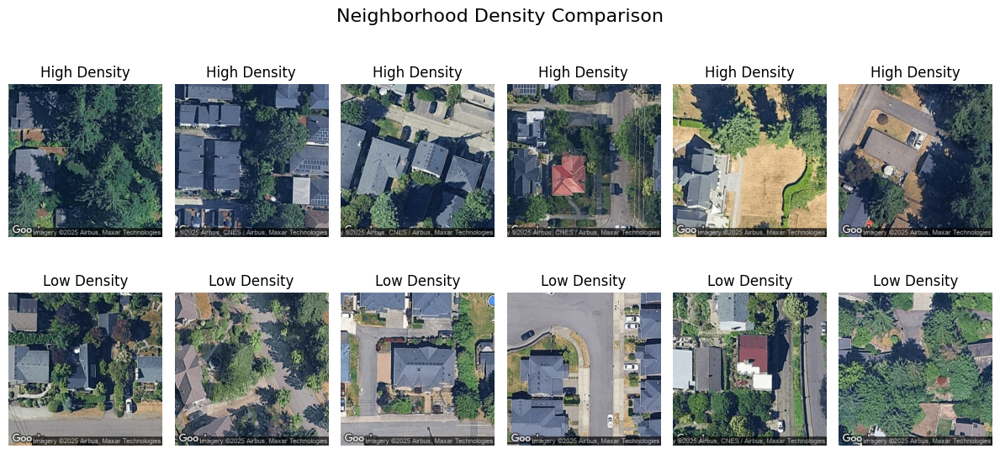

In [8]:
high_density = df[df["sqft_living15"] < df["sqft_living15"].quantile(0.25)]
low_density  = df[df["sqft_living15"] > df["sqft_living15"].quantile(0.75)]

high_ids = high_density.sample(6, random_state=RANDOM_SEED)["id"]
low_ids  = low_density.sample(6, random_state=RANDOM_SEED)["id"]

plt.figure(figsize=(12, 6))

for i, pid in enumerate(high_ids, 1):
    img = Image.open(os.path.join(IMAGE_DIR, f"{pid}.0.png"))
    plt.subplot(2, 6, i)
    plt.imshow(img)
    plt.title("High Density")
    plt.axis("off")

for i, pid in enumerate(low_ids, 7):
    img = Image.open(os.path.join(IMAGE_DIR, f"{pid}.0.png"))
    plt.subplot(2, 6, i)
    plt.imshow(img)
    plt.title("Low Density")
    plt.axis("off")

plt.suptitle("Neighborhood Density Comparison", fontsize=16)
plt.tight_layout()
plt.show()

Satellite image validation confirms that the downloaded imagery accurately captures meaningful environmental context. Waterfront properties consistently display visible water bodies, while neighborhood density metrics align with observed road layouts and plot spacing in the images. Random inspection further verifies consistent resolution, centering, and visual clarity across samples. These results confirm that the satellite imagery is suitable for downstream feature extraction using convolutional neural networks.

### Geospatial analysis

In [3]:
geometry = [Point(xy) for xy in zip(df['long'], df['lat'])]
gdf = gpd.GeoDataFrame(df, geometry=geometry)

# WGS84 coordinate system
gdf = gdf.set_crs(epsg=4326)

gdf.head()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,lat,long,sqft_living15,sqft_lot15,log_price,geometry
0,9117000170,268643,4,2.25,1810,9240,2.0,0,0,3,7,47.4362,-122.187,1660,9240,12.501142,POINT (-122.187 47.4362)
1,6700390210,245000,3,2.50,1600,2788,2.0,0,0,4,7,47.4034,-122.187,1720,3605,12.409018,POINT (-122.187 47.4034)
2,7212660540,200000,4,2.50,1720,8638,2.0,0,0,3,8,47.2704,-122.313,1870,7455,12.206078,POINT (-122.313 47.2704)
3,8562780200,352499,2,2.25,1240,705,2.0,0,0,3,7,47.5321,-122.073,1240,750,12.772806,POINT (-122.073 47.5321)
4,7760400350,232000,3,2.00,1280,13356,1.0,0,0,3,7,47.3715,-122.074,1590,8071,12.354497,POINT (-122.074 47.3715)


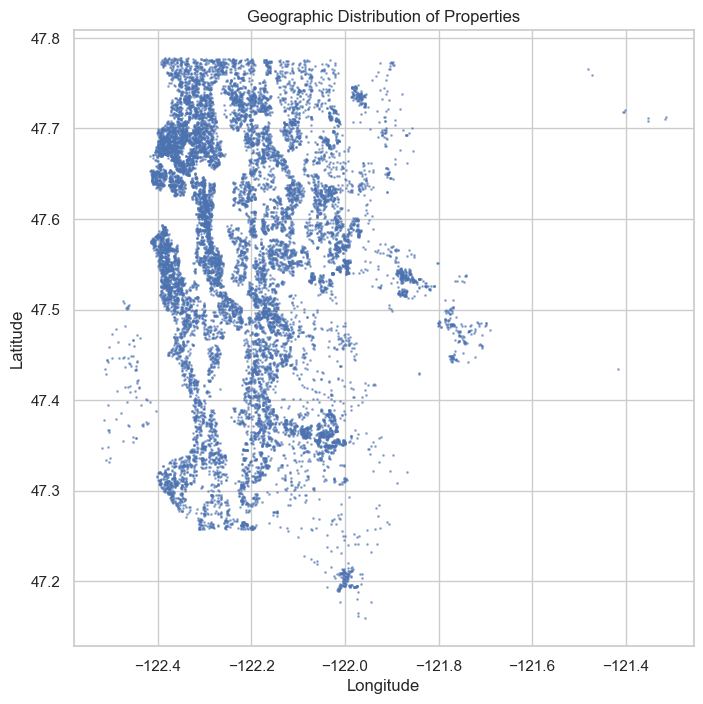

In [4]:
plt.figure(figsize=(8, 8))
plt.scatter(gdf['long'], gdf['lat'], s=1, alpha=0.5)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Geographic Distribution of Properties")
plt.show()

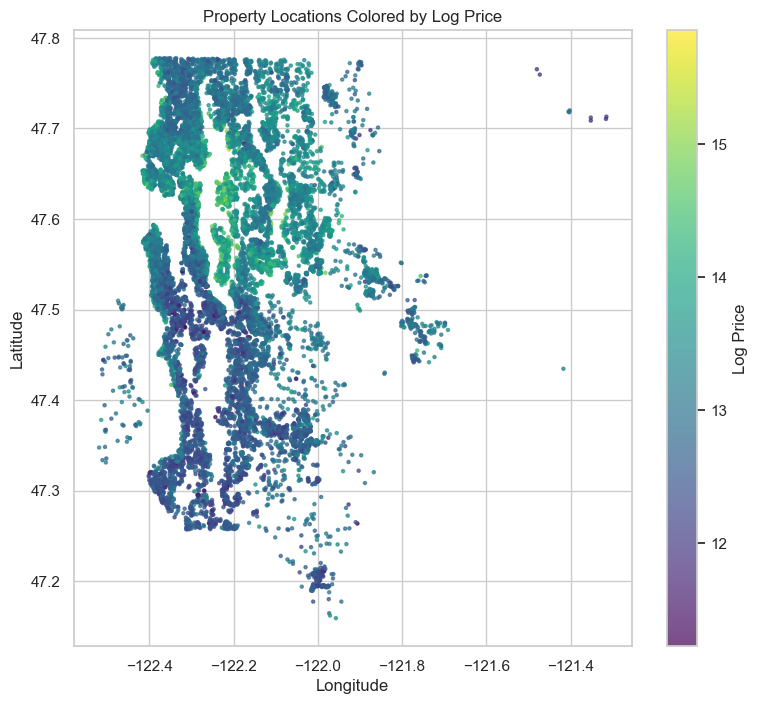

In [5]:
plt.figure(figsize=(9, 8))
scatter = plt.scatter(
    gdf['long'],
    gdf['lat'],
    c=gdf['log_price'],
    cmap='viridis',
    s=5,
    alpha=0.7
)

plt.colorbar(scatter, label="Log Price")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Property Locations Colored by Log Price")
plt.show()

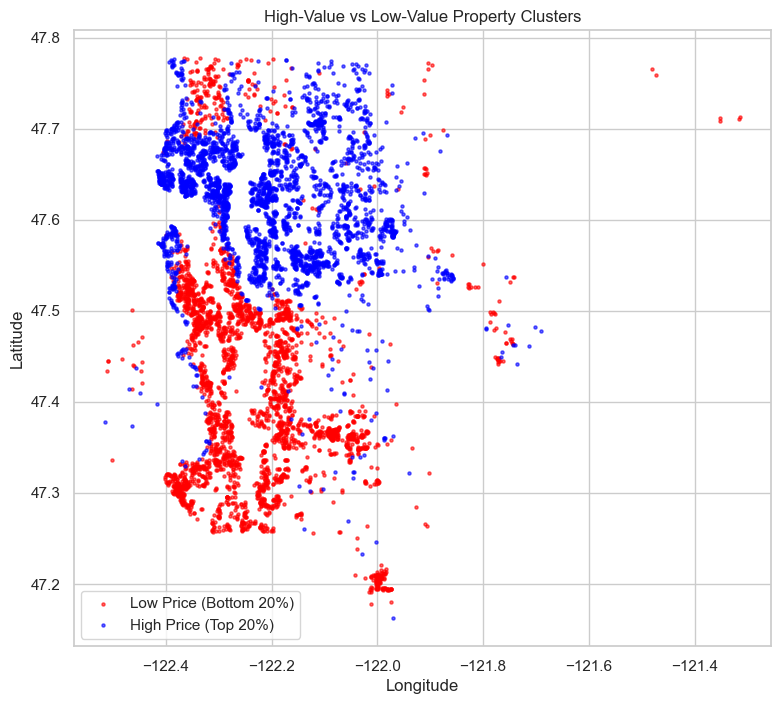

In [6]:
high_value = gdf[gdf['log_price'] >= gdf['log_price'].quantile(0.80)]
low_value  = gdf[gdf['log_price'] <= gdf['log_price'].quantile(0.20)]

plt.figure(figsize=(9, 8))
plt.scatter(low_value['long'], low_value['lat'],
            color='red', s=5, label='Low Price (Bottom 20%)', alpha=0.6)
plt.scatter(high_value['long'], high_value['lat'],
            color='blue', s=5, label='High Price (Top 20%)', alpha=0.6)

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("High-Value vs Low-Value Property Clusters")
plt.legend()
plt.show()

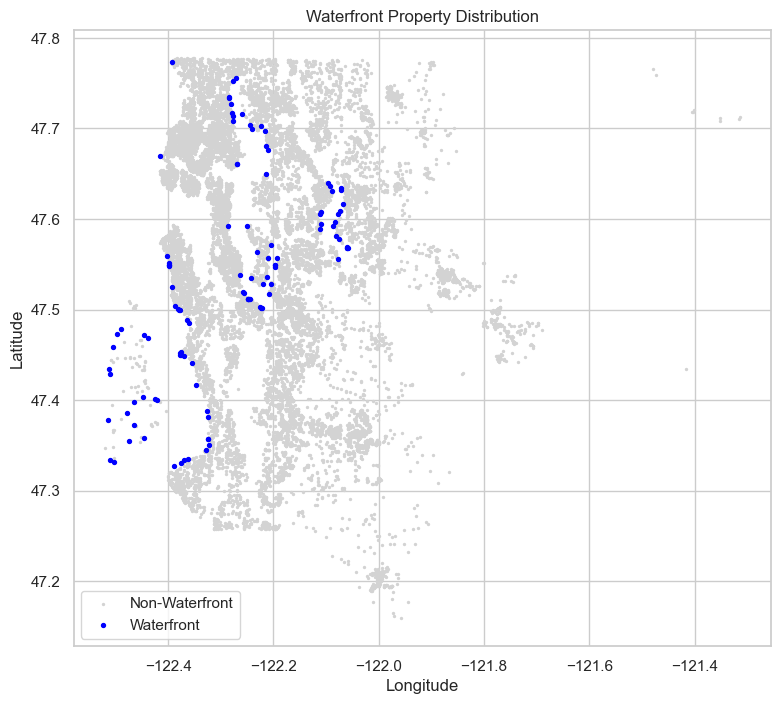

In [7]:
waterfront = gdf[gdf['waterfront'] == 1]

plt.figure(figsize=(9, 8))
plt.scatter(gdf['long'], gdf['lat'], s=2, color='lightgray', label='Non-Waterfront')
plt.scatter(waterfront['long'], waterfront['lat'],
            s=8, color='blue', label='Waterfront')

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Waterfront Property Distribution")
plt.legend()
plt.show()

In [8]:
top_10 = df.sort_values('price', ascending=False).head(10)
bottom_10 = df.sort_values('price', ascending=True).head(10)

top_10[['id', 'price']].reset_index(drop=True), bottom_10[['id', 'price']].reset_index(drop=True)

(           id    price
 0  6762700020  7700000
 1  9808700762  7062500
 2  9208900037  6885000
 3  1247600105  5110800
 4  1924059029  4668000
 5  3835500195  4489000
 6  6065300370  4208000
 7   853200010  3800000
 8  2303900100  3800000
 9  7397300170  3710000,
            id  price
 0  3421079032  75000
 1  8658300340  80000
 2  3028200080  81000
 3  3883800011  82000
 4  1523049188  84000
 5  1322049150  85000
 6  2422049104  85000
 7  1788900230  86500
 8  1423049019  90000
 9  2114700500  90000)

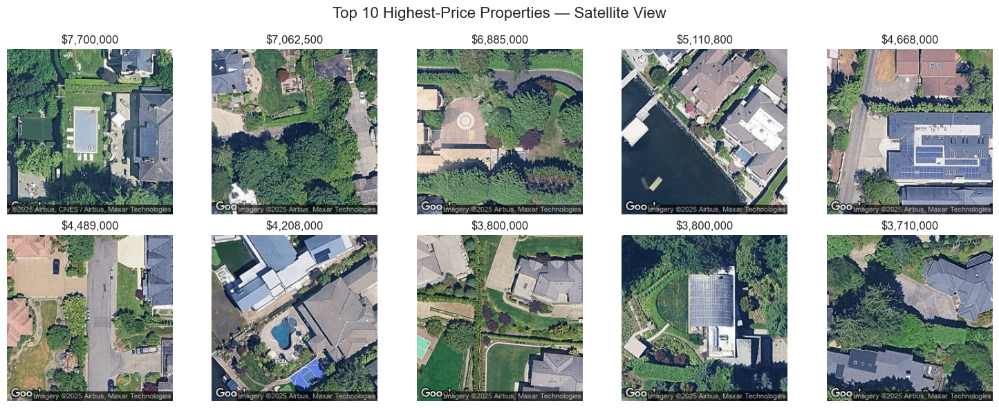

In [9]:
plt.figure(figsize=(15, 6))

for i, row in enumerate(top_10.itertuples(), 1):
    img_path = os.path.join(IMAGE_DIR, f"{row.id}.0.png")
    img = Image.open(img_path)

    plt.subplot(2, 5, i)
    plt.imshow(img)
    plt.title(f"${row.price:,.0f}")
    plt.axis("off")

plt.suptitle("Top 10 Highest-Price Properties — Satellite View", fontsize=16)
plt.tight_layout()
plt.show()

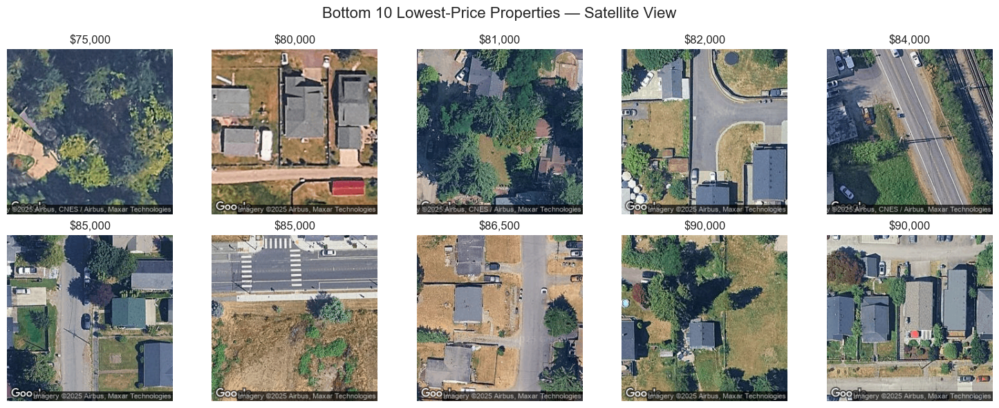

In [11]:
plt.figure(figsize=(15, 6))

for i, row in enumerate(bottom_10.itertuples(), 1):
    img_path = os.path.join(IMAGE_DIR, f"{row.id}.0.png")
    img = Image.open(img_path)

    plt.subplot(2, 5, i)
    plt.imshow(img)
    plt.title(f"${row.price:,.0f}")
    plt.axis("off")

plt.suptitle("Bottom 10 Lowest-Price Properties — Satellite View", fontsize=16)
plt.tight_layout()
plt.show()

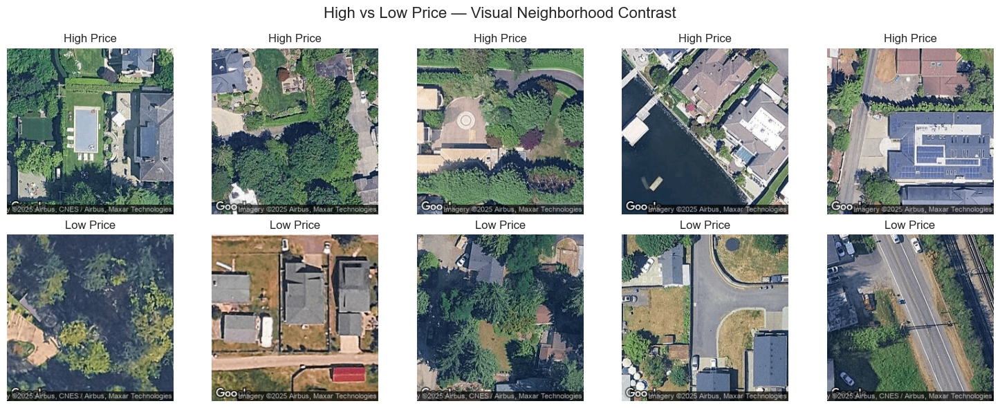

In [14]:
plt.figure(figsize=(15, 6))

for i, row in enumerate(top_10.head(5).itertuples(), 1):
    img = Image.open(os.path.join(IMAGE_DIR, f"{row.id}.0.png"))
    plt.subplot(2, 5, i)
    plt.imshow(img)
    plt.title("High Price")
    plt.axis("off")

for i, row in enumerate(bottom_10.head(5).itertuples(), 6):
    img = Image.open(os.path.join(IMAGE_DIR, f"{row.id}.0.png"))
    plt.subplot(2, 5, i)
    plt.imshow(img)
    plt.title("Low Price")
    plt.axis("off")

plt.suptitle("High vs Low Price — Visual Neighborhood Contrast", fontsize=16)
plt.tight_layout()
plt.show()